In [1]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import matplotlib as mpl
# enables correct plotting of text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42 

import celltypist

In [ ]:
# import session_info
# session_info.show()

In [4]:
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("module.name", "/nfs/team205/kk18/function/python/utils.py")
utils = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = utils
spec.loader.exec_module(utils)

In [5]:
sc.settings.set_figure_params(dpi=80)

# Variables

In [6]:
adata_dir = '/lustre/scratch126/cellgen/team205/kk18/VisiumHD/objects/subsets'
sample_id = 'HEA_FOET14880396'
celltype = 'AtrialCardiomyocytes'

In [7]:
figdir = '/nfs/team205/heart/fetal_ms_figures/raw_plots_kk/Aug2024'
table_dir = '/nfs/team205/heart/fetal_ms_figures/tables/Aug2024'

# Read in data

In [8]:
# read in
adata = sc.read_h5ad(f'{adata_dir}/{sample_id}_{celltype}_b2c_cells_filtered_lognorm.h5ad')
adata

AnnData object with n_obs × n_vars = 13904 × 17650
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_1', 'leiden_1.2', 'leiden_1.5', 'leiden_2', 'fine_grain_manual'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coarse2midmod_co

# Remove mid-grain markers from the feature

In [12]:
# read in
midgrain_markers = pd.read_csv('/nfs/team205/kk18/notebooks/Foetal/VisiumHD/re-seq_mpp0p3/sc_midgrain_markers.csv',
                               index_col=0
                              )
# remove the markers of celltype of interest
midgrain_markers = midgrain_markers[midgrain_markers['group']!=celltype]
midgrain_markers

,group,names,scores,logfoldchanges,pvals,pvals_adj,group_mean
7182,VentricularCardiomyocytes,TTN,729.605300,6.962344,0.0,0.0,4.691398
7183,VentricularCardiomyocytes,TNNT2,638.149050,5.632370,0.0,0.0,3.141793
7184,VentricularCardiomyocytes,MYH7,619.916700,7.775417,0.0,0.0,3.322476
7185,VentricularCardiomyocytes,SORBS2,608.207900,5.980288,0.0,0.0,3.669104
7186,VentricularCardiomyocytes,MYL3,571.206540,6.671613,0.0,0.0,2.832341
...,...,...,...,...,...,...,...
102668,LymphoidCells,ADK,54.743217,1.088896,0.0,0.0,1.117559
102770,LymphoidCells,FCHSD2,51.053140,1.119463,0.0,0.0,1.309117
102785,LymphoidCells,SPIDR,50.689087,1.023158,0.0,0.0,1.011237
102788,LymphoidCells,IMMP2L,50.527325,1.016055,0.0,0.0,1.424370


In [10]:
'GATA2' in list(midgrain_markers['names'])

False

In [32]:
# remove
mask = [x not in list(midgrain_markers['names']) for x in adata.var_names]
bdata = adata[:,mask]
bdata

View of AnnData object with n_obs × n_vars = 13904 × 16391
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_1', 'leiden_1.2', 'leiden_1.5', 'leiden_2', 'fine_grain_manual'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coarse2m

# PCA, Clustering, UMAP

number of hvgs: 3248


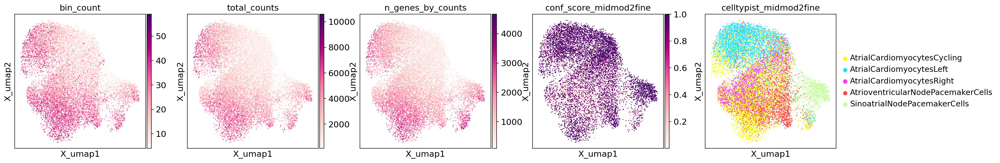

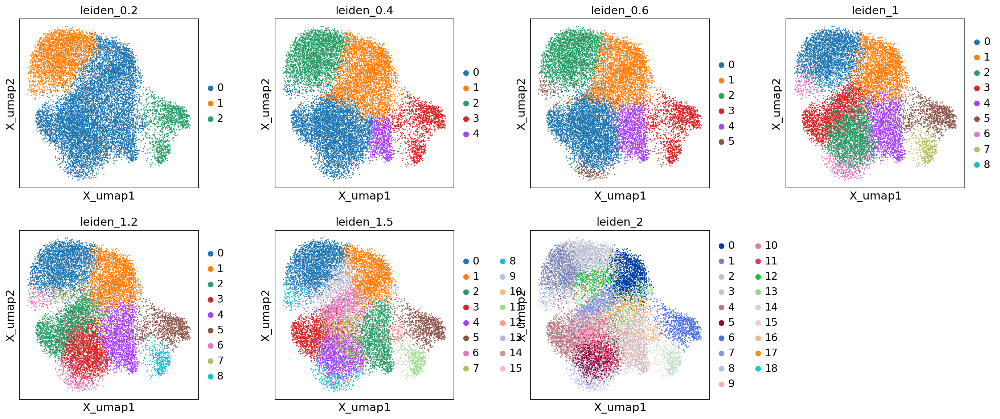

In [33]:
# HVGs, using the object which doesn't have midgrain markers
sc.pp.highly_variable_genes(bdata, flavor='seurat', min_mean=0.0125, max_mean=3, min_disp=0.5)
print(f'number of hvgs: {sum(bdata.var.highly_variable)}')
# PCA using the degected HVGs
sc.tl.pca(bdata, use_highly_variable=True)
adata.obsm['X_pca'] = bdata.obsm['X_pca'].copy()
# create neighbour graph
sc.pp.neighbors(adata,n_neighbors=15,use_rep='X_pca')
# visualisation with umap
sc.tl.umap(adata,min_dist=0.5)
sc.pl.embedding(adata,basis='X_umap',color=['bin_count','total_counts','n_genes_by_counts',"conf_score_midmod2fine","celltypist_midmod2fine",],
                wspace=0.2,cmap='RdPu',vmax='p100',ncols=5)
# leiden clustering
resolutions_list = [0.2,0.4,0.6,1,1.2,1.5,2]
for resolution in resolutions_list:
    sc.tl.leiden(adata,resolution=resolution,key_added=f'leiden_{str(resolution)}',n_iterations=2)
sc.pl.embedding(adata,basis='X_umap',
                color=[f'leiden_{str(resolution)}' for resolution in resolutions_list],
                wspace=0.3)

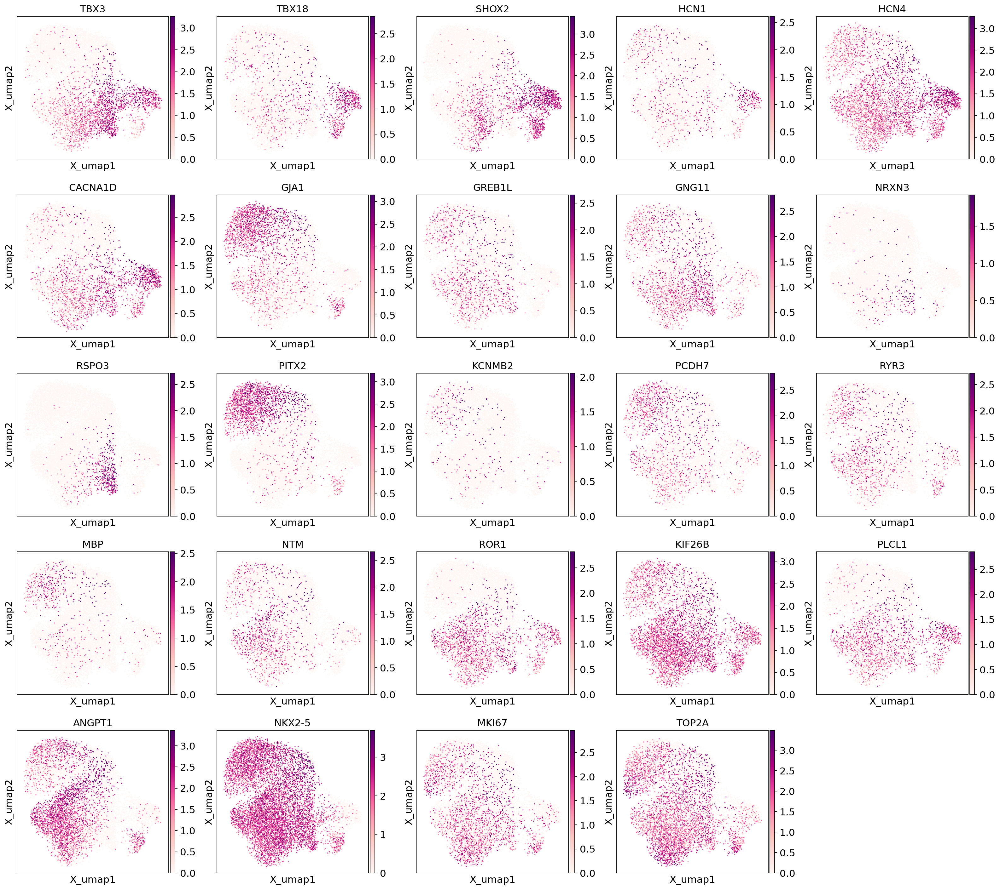

In [34]:
genes = ['TBX3','TBX18','SHOX2','HCN1','HCN4','CACNA1D', 'GJA1',# SANPC
         'GREB1L','GNG11','NRXN3','RSPO3', # AVNPC
         'PITX2','KCNMB2','PCDH7','RYR3','MBP', # aCM_left
         'NTM','ROR1','KIF26B','PLCL1','ANGPT1', # aCM_right
         'NKX2-5','MKI67','TOP2A'
        ]
genes = [x for x in genes if x in adata.var_names]
sc.pl.embedding(adata,basis='X_umap',color=genes,
               ncols=5, wspace=0.2,cmap='RdPu',vmax='p99.7')

In [35]:
resolution_sel = 1

categories: 0, 1, 2, etc.
var_group_labels: CM, FB, EC, etc.


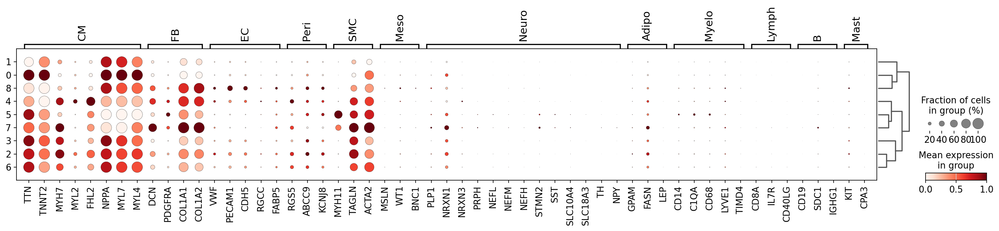

In [36]:
markers = {
    'CM': ['TTN', 'TNNT2','MYH6',
        'MYH7', 'MYL2', 'FHL2', # vCN
            'NPPA', 'MYL7', 'MYL4'], #aCM
    'FB': ['DCN', 'GCN', 'PDGFRA','COL1A1','COL1A2'],
    'EC': ['VWF', 'PECAM1', 'CDH5','RGCC', 'FABP5',],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3','PRPH', 'NEFL', 'NEFM', 'NEFH', 'STMN2', 'SST', 'SLC10A4', 'SLC18A3', 'TH', 'NPY'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68','LYVE1','TIMD4'],
    'Lymph': ['CD8A', 'IL7R', 'CD40LG'],
    'B': ['CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
}

for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in adata.var_names]

sc.tl.dendrogram(adata, groupby=f'leiden_{str(resolution_sel)}')
sc.pl.dotplot(adata,
              markers, 
              groupby=f'leiden_{str(resolution_sel)}',
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              swap_axes=False,
             )

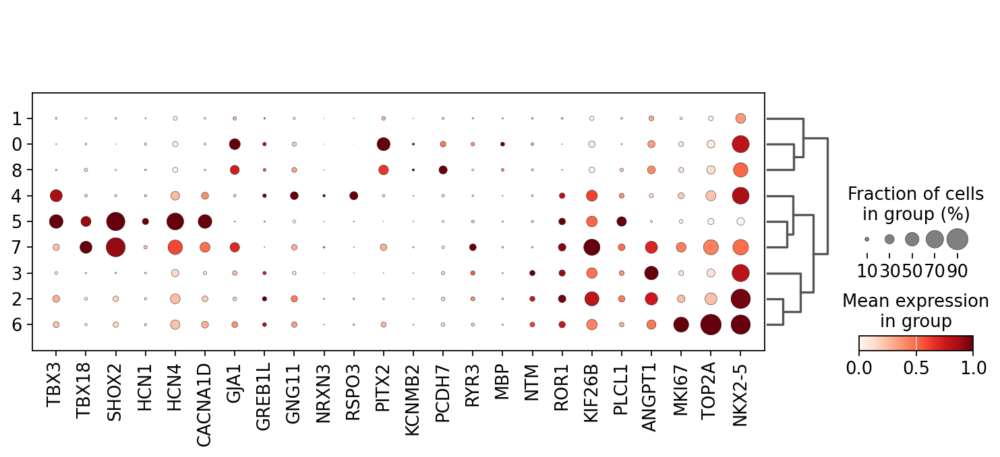

In [37]:
genes = ['TBX3','TBX18','SHOX2','HCN1','HCN4','CACNA1D', 'GJA1',# SANPC
         'GREB1L','GNG11','NRXN3','RSPO3', # AVNPC
         'PITX2','KCNMB2','PCDH7','RYR3','MBP', # aCM_left
         'NTM','ROR1','KIF26B','PLCL1','ANGPT1', # aCM_right
         'MKI67','TOP2A','NKX2-5'
        ]
genes = [x for x in genes if x in adata.var_names]

sc.tl.dendrogram(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.pl.dotplot(adata,
              var_names=genes,
              groupby=f'leiden_{str(resolution_sel)}',
              standard_scale='var',
              dendrogram=True
             )

[1.10352081 1.83785365 1.6291659  0.70335836 1.24040478]


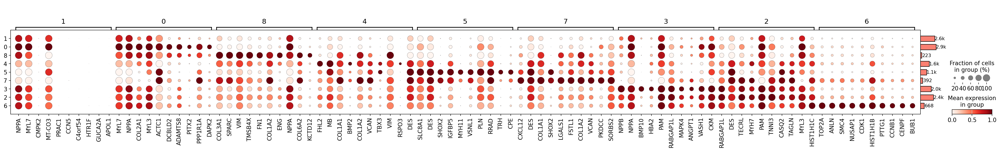

In [38]:
# DEG analysis
print(adata.X.data[:5])
adata.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.tl.dendrogram(adata, groupby=f'leiden_{str(resolution_sel)}')
dp=sc.pl.rank_genes_groups_dotplot(adata, dendrogram=True, standard_scale='var', return_fig=True)
dp.add_totals().show()

[1.10352081 1.83785365 1.6291659  0.70335836 1.24040478]


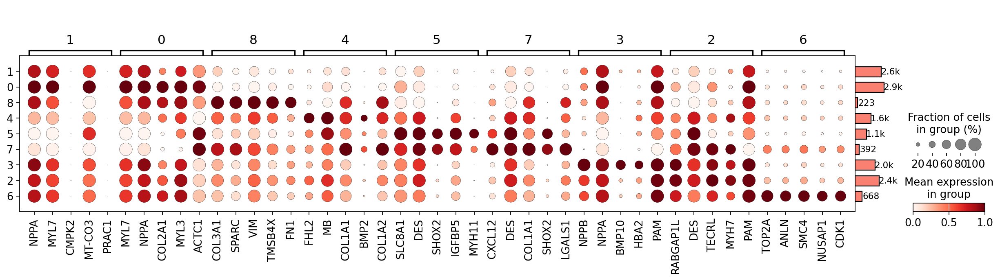

In [39]:
# DEG analysis
print(adata.X.data[:5])
adata.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.tl.dendrogram(adata, groupby=f'leiden_{str(resolution_sel)}')
dp=sc.pl.rank_genes_groups_dotplot(adata, dendrogram=True, standard_scale='var', return_fig=True, n_genes=5)
dp.add_totals().show()

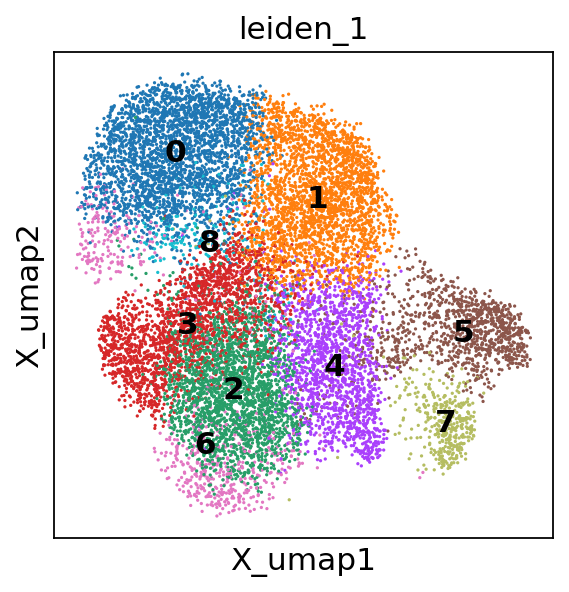

In [40]:
sc.pl.embedding(adata,basis='X_umap',
                color=f'leiden_{str(resolution_sel)}',
                wspace=0.3, legend_loc='on data')

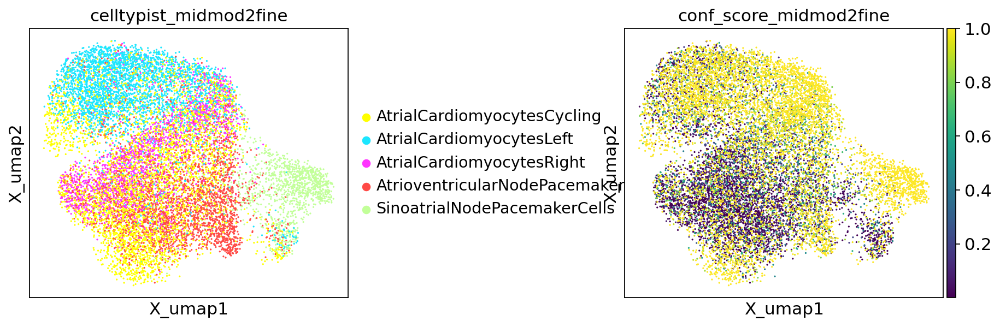

In [41]:
sc.pl.embedding(adata,basis='X_umap',
                color=['celltypist_midmod2fine', 'conf_score_midmod2fine'],
                wspace=0.7)

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

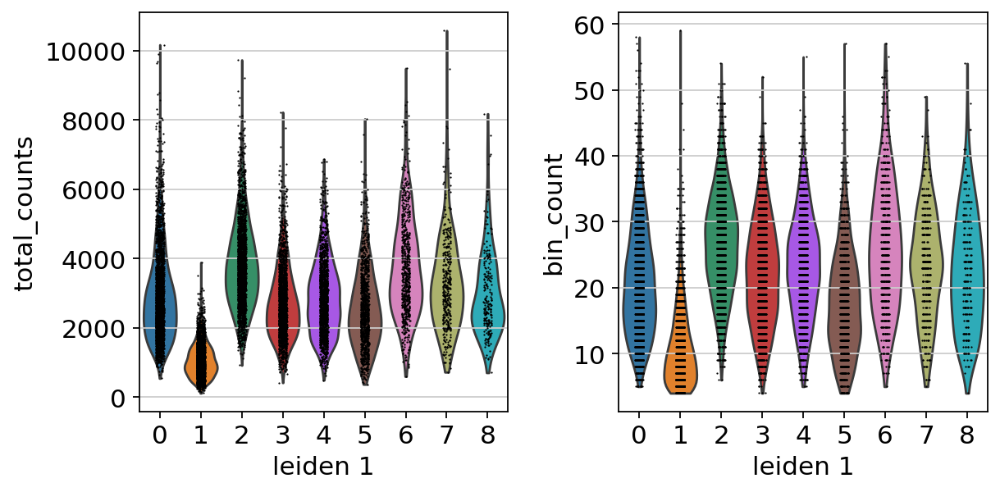

In [42]:
sc.pl.violin(adata,keys=['total_counts','bin_count'],groupby=f'leiden_{str(resolution_sel)}')

--> cluster 1 has low total_counts and bin_counts. and no specific marker expression --> will annotated as "unassigned"

In [43]:
# annotate
adata.obs['fine_grain_manual'] = adata.obs[f'leiden_{str(resolution_sel)}'].copy()
adata.obs.replace({'fine_grain_manual':{
    '0':'AtrialCardiomyocytesLeft',
    '1':'unassigned',
    '2':'AtrialCardiomyocytesRight',
    '3':'AtrialCardiomyocytesRight',
    '4':'AtrioventricularNodePacemakerCells',
    '5':'SinoatrialNodePacemakerCells',
    '6':'AtrialCardiomyocytesRight',
    '7':'SinoatrialNodePacemakerCells',
    '8':'AtrialCardiomyocytesLeft',
}},inplace=True)
adata.obs['fine_grain_manual'].value_counts()

fine_grain_manual
AtrialCardiomyocytesRight             5060
AtrialCardiomyocytesLeft              3107
unassigned                            2625
AtrioventricularNodePacemakerCells    1602
SinoatrialNodePacemakerCells          1510
Name: count, dtype: int64

In [22]:
ad = sc.read_h5ad('/nfs/team205/heart/anndata_objects/Foetal/Feb28ObjectRaw_finegrain_updated.h5ad',backed='r')
set(ad.obs['fine_grain'])

{'AtrialCardiomyocytesCycling',
 'AtrialCardiomyocytesLeft',
 'AtrialCardiomyocytesRight',
 'AtrioventricularNodePacemakerCells',
 'BCells',
 'BCellsMS4A1pos',
 'ChromaffinCells',
 'CoronaryArterialEndothelialCells',
 'CoronaryCapillaryEndothelialCells',
 'CoronaryPericytes',
 'CoronarySmoothMuscleCells',
 'CoronaryVenousEndothelialCells',
 'CoronaryVesselAdventitialFibroblasts',
 'DendriticCellsMature',
 'DendriticCellsType1',
 'DuctusArteriosusSmoothMuscleCells',
 'EndocardialCells',
 'EndocardialCushionCells',
 'EpicardiumDerivedCells',
 'GreatVesselAdventitialFibroblasts',
 'GreatVesselArterialEndothelialCells',
 'GreatVesselSmoothMuscleCells',
 'GreatVesselVenousEndothelialCells',
 'InnateLymphoidCells',
 'LymphNodeFibroblasticReticularCells',
 'LymphaticEndothelialCells',
 'MacrophagesATF3pos',
 'MacrophagesCX3CR1pos',
 'MacrophagesLYVE1pos',
 'MacrophagesTIMD4pos',
 'MastCells',
 'Megakaryocytes',
 'MesothelialEpicardialCells',
 'MonocyteDerivedCells',
 'Monocytes',
 'MonocytesM

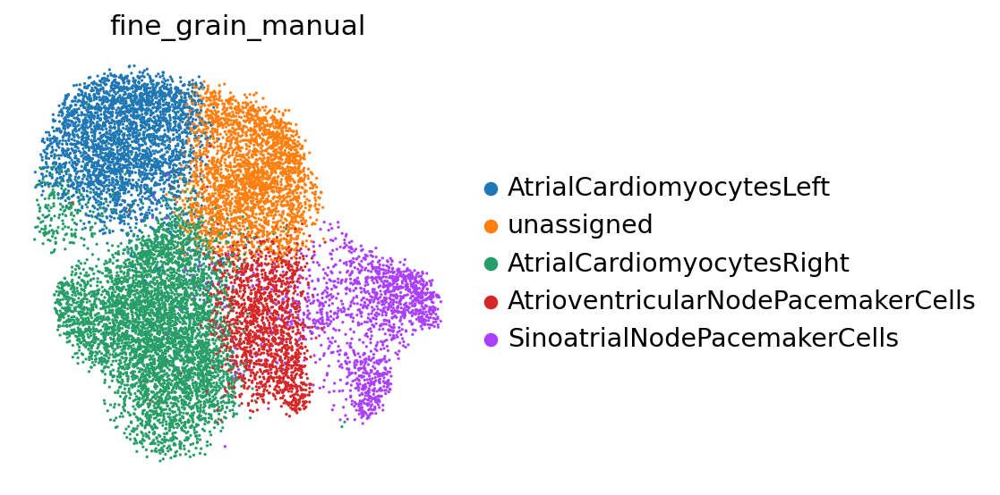

In [44]:
sc.pl.embedding(adata,basis='X_umap',
                color='fine_grain_manual',
                frameon=False,
                wspace=0.3)

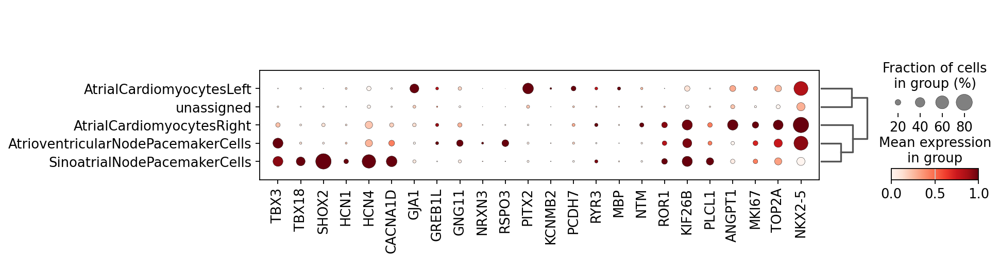

In [45]:
genes = ['TBX3','TBX18','SHOX2','HCN1','HCN4','CACNA1D', 'GJA1',# SANPC
         'GREB1L','GNG11','NRXN3','RSPO3', # AVNPC
         'PITX2','KCNMB2','PCDH7','RYR3','MBP', # aCM_left
         'NTM','ROR1','KIF26B','PLCL1','ANGPT1', # aCM_right
         'MKI67','TOP2A','NKX2-5'
        ]
genes = [x for x in genes if x in adata.var_names]

sc.tl.dendrogram(adata,groupby='fine_grain_manual')
sc.pl.dotplot(adata,
              var_names=genes,
              groupby='fine_grain_manual',
              standard_scale='var',
              dendrogram=True
             )

# Subset SAN cells

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'MATH': 39 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'C', 'H', 'L', 'N', 'O', 'P', 'R', 'S', 'X', 'a', 'c', 'd', 'e', 'f', 'four', 'g', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'r', 's', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 36, 38, 43, 47, 49, 50, 51, 53, 54, 59, 66, 68, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 85, 86, 87, 88, 89, 92]
Closed glyph list over 'MATH': 39 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'C', 'H', 'L', 'N', 'O', 'P', 'R', 'S', 'X', 'a', 'c', 'd', 'e', 'f', 'four', 'g', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'r', 's', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 36, 38, 43, 47, 4

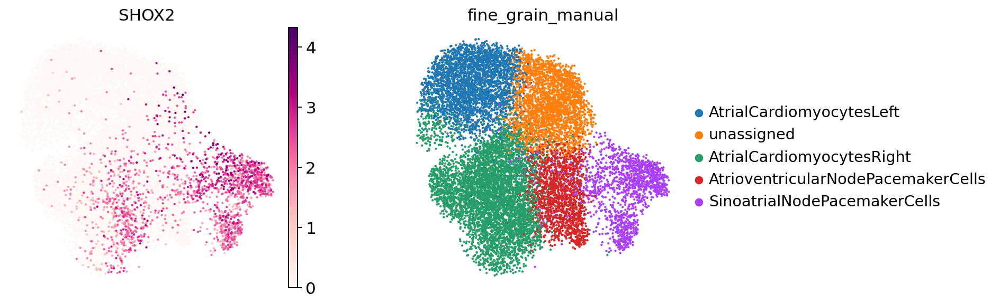

In [46]:
sc.pl.embedding(adata,basis='X_umap',
                color=['SHOX2','fine_grain_manual'],
                frameon=False, cmap='RdPu', size=15,
                wspace=0.3, show=False)
plt.savefig(f'{figdir}/VisiumHD_euploid_atrialCM_UMAP.pdf', bbox_inches="tight",dpi=300)

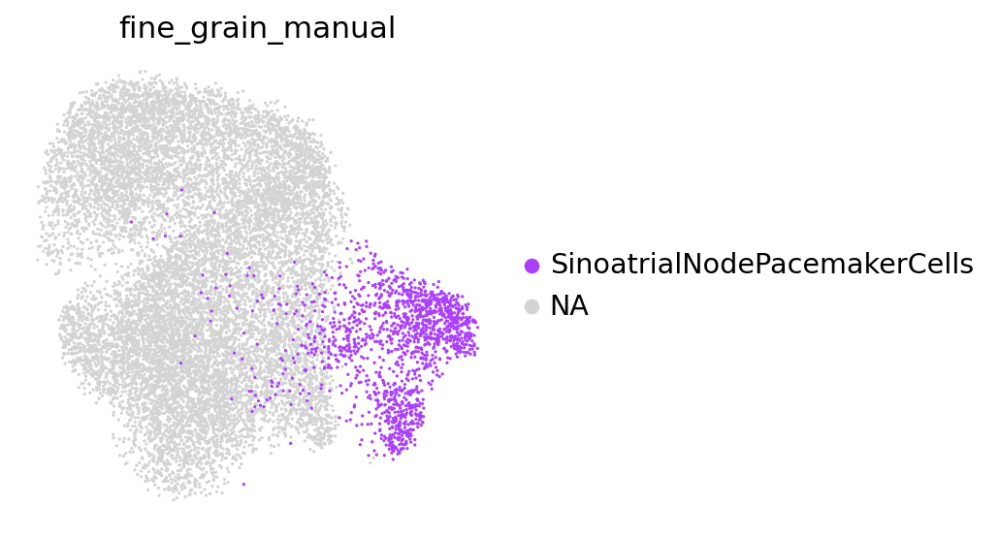

In [47]:
sc.pl.embedding(adata,basis='X_umap',
                color='fine_grain_manual',groups='SinoatrialNodePacemakerCells',
                frameon=False,
                wspace=0.3)

In [48]:
san = adata[adata.obs['fine_grain_manual']=='SinoatrialNodePacemakerCells']

# drop leiden clustering results
resolutions_list = [0.2,0.4,0.6,1, 1.2,1.5,2]
for resolution in resolutions_list:
    san.obs.drop(f'leiden_{str(resolution)}',axis=1,inplace=True)
san

AnnData object with n_obs × n_vars = 1510 × 17650
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'fine_grain_manual'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coarse2midmod_colors', 'celltypist_coarse_colors', 'celltypist_coarse_fin_colors', 'celltypist_mid_fin_colors',

In [49]:
# remove mid_grain markers
mask = [x not in list(midgrain_markers['names']) for x in san.var_names]
bdata = san[:,mask]
bdata

View of AnnData object with n_obs × n_vars = 1510 × 16391
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'fine_grain_manual'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coarse2midmod_colors', 'celltypist_coarse_colors', 'celltypist_coarse_fin_colors', 'celltypist_mid_fin_

In [50]:
# HVGs, using the object which doesn't have midgrain markers
sc.pp.highly_variable_genes(bdata, flavor='seurat', min_mean=0.0125, max_mean=3, min_disp=0.5)
print(f'number of hvgs: {sum(bdata.var.highly_variable)}')
# PCA using the degected HVGs
sc.tl.pca(bdata, use_highly_variable=True)
san.obsm['X_pca'] = bdata.obsm['X_pca'].copy()
# create neighbour graph
sc.pp.neighbors(san,n_neighbors=15,use_rep='X_pca')

number of hvgs: 3692


In [51]:
sc.tl.umap(san,min_dist=0.1)

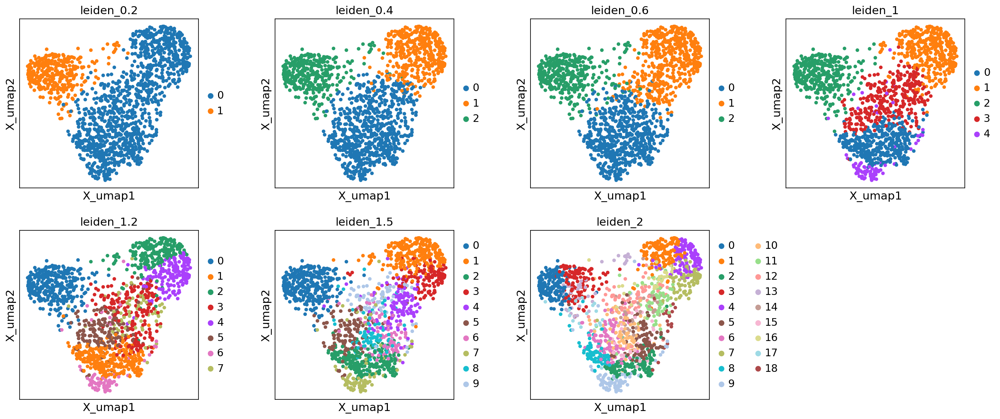

CPU times: user 1.45 s, sys: 31.3 ms, total: 1.48 s
Wall time: 1.95 s


In [52]:
%%time
# reclustering
# leiden clustering
resolutions_list = [0.2,0.4,0.6,1, 1.2,1.5,2]
for resolution in resolutions_list:
    sc.tl.leiden(san,resolution=resolution,key_added=f'leiden_{str(resolution)}',n_iterations=2)
sc.pl.embedding(san,basis='X_umap',
                color=[f'leiden_{str(resolution)}' for resolution in resolutions_list],
                wspace=0.3)

In [55]:
san_resolution_sel = 0.6

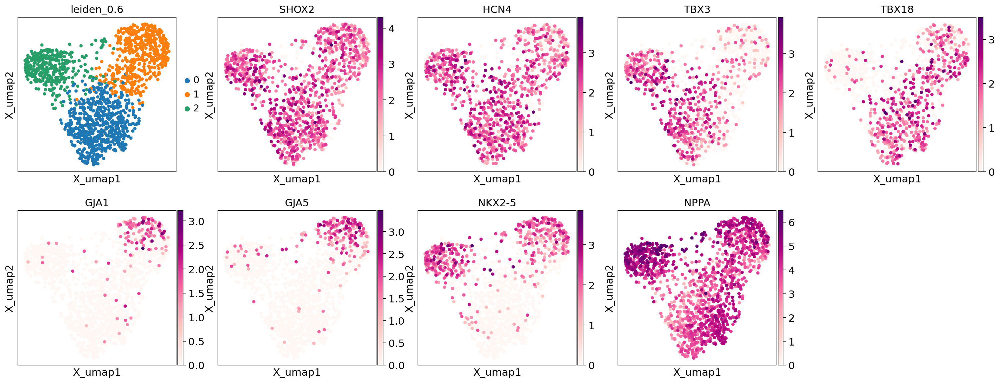

In [56]:
genes = ['SHOX2','HCN4','TBX3','TBX18',
         'GJA1', # CX43
         'GJA5', # CX40
         'NKX2-5',
         'NPPA'
        ]
genes = [x for x in genes if x in san.var_names]
sc.pl.embedding(san,basis='X_umap',
                color=[f'leiden_{str(san_resolution_sel)}']+genes,
               ncols=5, wspace=0.15,cmap='RdPu',vmax='p100')

In [57]:
# annotate
san.obs['fine_grain_manual'] = san.obs[f'leiden_{str(san_resolution_sel)}'].copy()
san.obs.replace({'fine_grain_manual':{
    '0':'SinoatrialNodePacemakerCellsHead',
    '1':'SinoatrialNodePacemakerCellsHorn',
    '2':'SinoatrialNodePacemakerCellsTail',
}},inplace=True)
san.obs['fine_grain_manual'].value_counts()

fine_grain_manual
SinoatrialNodePacemakerCellsHead    636
SinoatrialNodePacemakerCellsHorn    501
SinoatrialNodePacemakerCellsTail    373
Name: count, dtype: int64

In [58]:
san.obs['fine_grain_manual'] = san.obs['fine_grain_manual'].astype('category')
san.obs['fine_grain_manual'] = san.obs['fine_grain_manual'].cat.reorder_categories([
    'SinoatrialNodePacemakerCellsHorn',
    'SinoatrialNodePacemakerCellsHead',
    'SinoatrialNodePacemakerCellsTail'
])

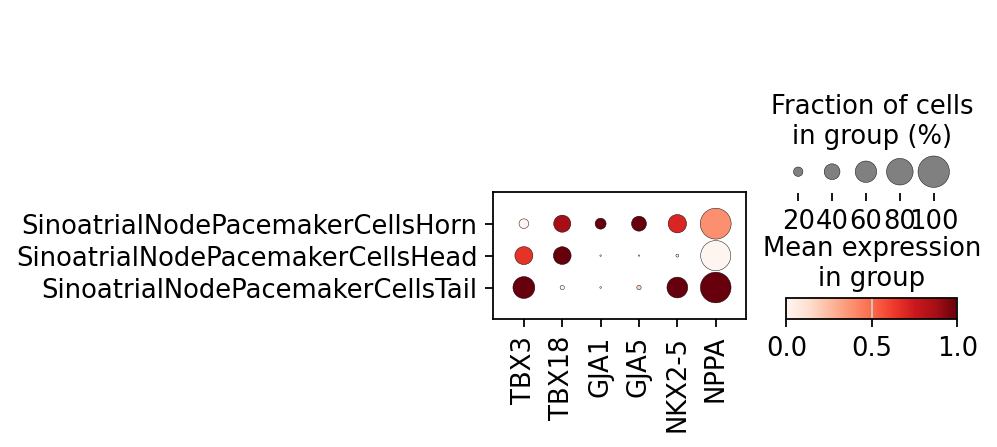

In [59]:
genes = ['TBX3','TBX18',
         'GJA1', # CX43
         'GJA5', # CX40
         'NKX2-5','NPPA']
genes = [x for x in genes if x in san.var_names]
sc.pl.dotplot(san,
              var_names=genes,
              groupby='fine_grain_manual',
              standard_scale='var',
              dendrogram=False
             )

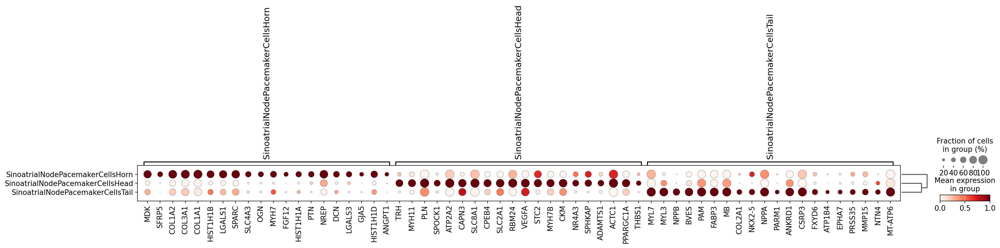

In [60]:
res = utils.rank_genes_groups_with_mean(san,groupby='fine_grain_manual',
                                        log2fc_min=0,method='t-test')
n_rank = 20
markers = {}
for group in res['group'].unique():
    res_sub = res[res['group']==group]
    res_sub = res_sub.sort_values('scores',ascending=False)
    markers[group] = list(res_sub['names'])[:n_rank]

sc.tl.dendrogram(san,groupby='fine_grain_manual',var_names=markers,)
sc.pl.dotplot(san,
              var_names=markers,
              groupby='fine_grain_manual',
              standard_scale='var',
              dendrogram=True
             )

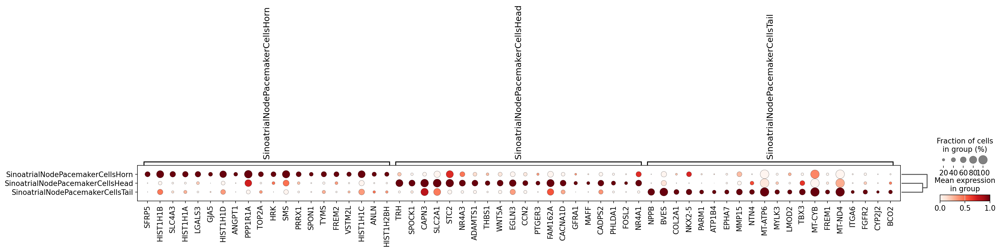

In [61]:
# with removing mid_grain markers
# remove mid_grain markers
mask = [x not in list(midgrain_markers['names']) for x in san.var_names]
bdata = san[:,mask]

res = utils.rank_genes_groups_with_mean(bdata,groupby='fine_grain_manual',
                                        log2fc_min=0,method='t-test')
n_rank = 20
markers = {}
for group in res['group'].unique():
    res_sub = res[res['group']==group]
    res_sub = res_sub.sort_values('scores',ascending=False)
    markers[group] = list(res_sub['names'])[:n_rank]

sc.tl.dendrogram(bdata,groupby='fine_grain_manual',var_names=markers,)
sc.pl.dotplot(bdata,
              var_names=markers,
              groupby='fine_grain_manual',
              standard_scale='var',
              dendrogram=True
             )

In [62]:
# add the annotation to the original adata
adata.obs['fine_grain_manual'] = adata.obs['fine_grain_manual'].astype('str')
adata.obs.loc[san.obs_names,'fine_grain_manual'] = san.obs['fine_grain_manual'].astype('str').copy()
adata.obs['fine_grain_manual'].value_counts()

fine_grain_manual
AtrialCardiomyocytesRight             5060
AtrialCardiomyocytesLeft              3107
unassigned                            2625
AtrioventricularNodePacemakerCells    1602
SinoatrialNodePacemakerCellsHead       636
SinoatrialNodePacemakerCellsHorn       501
SinoatrialNodePacemakerCellsTail       373
Name: count, dtype: int64

# Save

In [63]:
# save
adata.write(f'{adata_dir}/{sample_id}_{celltype}_b2c_cells_filtered_lognorm.h5ad')
print(f'{adata_dir}/{sample_id}_{celltype}_b2c_cells_filtered_lognorm.h5ad')

... storing 'fine_grain_manual' as categorical


/lustre/scratch126/cellgen/team205/kk18/VisiumHD/objects/subsets/HEA_FOET14880396_AtrialCardiomyocytes_b2c_cells_filtered_lognorm.h5ad


# Read in for plotting

In [8]:
adata = sc.read_h5ad(f'{adata_dir}/{sample_id}_{celltype}_b2c_cells_filtered_lognorm.h5ad')
adata

AnnData object with n_obs × n_vars = 13904 × 17650
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_1', 'leiden_1.2', 'leiden_1.5', 'leiden_2', 'fine_grain_manual'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coarse2midmod_co

In [10]:
set(adata.obs['fine_grain_manual'])

{'AtrialCardiomyocytesLeft',
 'AtrialCardiomyocytesRight',
 'AtrioventricularNodePacemakerCells',
 'SinoatrialNodePacemakerCellsHead',
 'SinoatrialNodePacemakerCellsHorn',
 'SinoatrialNodePacemakerCellsTail',
 'unassigned'}

In [11]:
san = adata[adata.obs['fine_grain_manual'].isin(['SinoatrialNodePacemakerCellsHead',
 'SinoatrialNodePacemakerCellsHorn',
 'SinoatrialNodePacemakerCellsTail'])]
san

View of AnnData object with n_obs × n_vars = 1510 × 17650
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_1', 'leiden_1.2', 'leiden_1.5', 'leiden_2', 'fine_grain_manual'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltypist_coarse2mi

In [13]:
# remove mid_grain markers
mask = [x not in list(midgrain_markers['names']) for x in san.var_names]
bdata = san[:,mask]

# HVGs, using the object which doesn't have midgrain markers
sc.pp.highly_variable_genes(bdata, flavor='seurat', min_mean=0.0125, max_mean=3, min_disp=0.5)
print(f'number of hvgs: {sum(bdata.var.highly_variable)}')
# PCA using the degected HVGs
sc.tl.pca(bdata, use_highly_variable=True)
san.obsm['X_pca'] = bdata.obsm['X_pca'].copy()
# create neighbour graph
sc.pp.neighbors(san,n_neighbors=15,use_rep='X_pca')
# umap
sc.tl.umap(san,min_dist=0.1)

number of hvgs: 3692


maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'MATH': 27 glyphs before
Glyph names: ['.notdef', '.null', 'C', 'H', 'N', 'P', 'S', 'T', 'a', 'c', 'd', 'e', 'f', 'g', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 's', 'space', 't', 'u', 'underscore']
Glyph IDs:   [0, 1, 2, 3, 38, 43, 49, 51, 54, 55, 66, 68, 70, 71, 72, 73, 74, 76, 78, 79, 80, 81, 82, 85, 86, 87, 88]
Closed glyph list over 'MATH': 27 glyphs after
Glyph names: ['.notdef', '.null', 'C', 'H', 'N', 'P', 'S', 'T', 'a', 'c', 'd', 'e', 'f', 'g', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'r', 's', 'space', 't', 'u', 'underscore']
Glyph IDs:   [0, 1, 2, 3, 38, 43, 49, 51, 54, 55, 66, 68, 70, 71, 72, 73, 74, 76, 78, 79, 80, 81, 82, 85, 86, 87, 88]
Closing glyph list over 'GSUB': 27 glyphs before
Glyph names: ['.notdef', '.null', 'C', 'H', 'N', 'P', 'S', 'T', 'a', 'c', 'd', 'e', 'f', 'g'

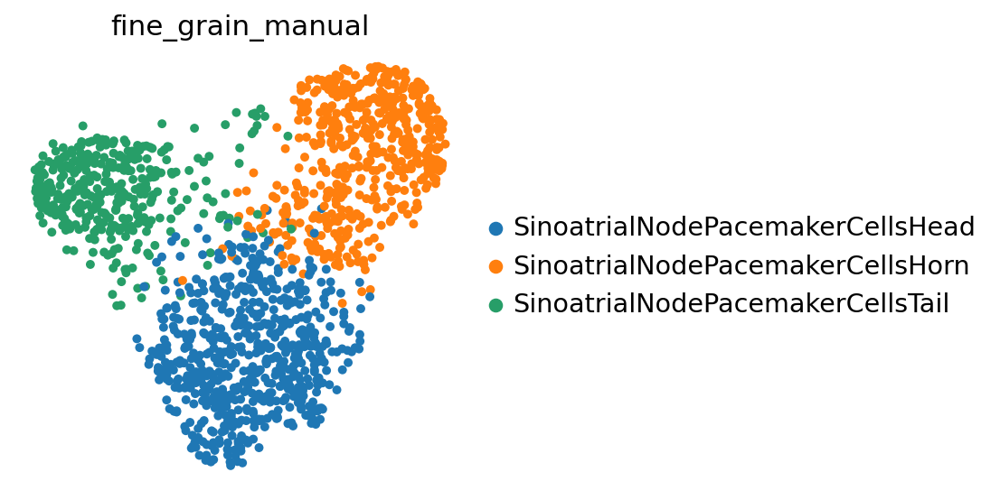

In [16]:
sc.pl.embedding(san,basis='X_umap',
                color=['fine_grain_manual'],
               frameon=False,show=False)
plt.savefig(f'{figdir}/VisiumHD_euploid_SANPC_UMAP.pdf', bbox_inches="tight",dpi=300)

In [21]:
?sc.pl.dotplot

Signature:
sc.pl.dotplot(
    adata: 'AnnData',
    var_names: '_VarNames | Mapping[str, _VarNames]',
    groupby: 'str | Sequence[str]',
    *,
    use_raw: 'bool | None' = None,
    log: 'bool' = False,
    num_categories: 'int' = 7,
    expression_cutoff: 'float' = 0.0,
    mean_only_expressed: 'bool' = False,
    cmap: 'str' = 'Reds',
    dot_max: 'float | None' = None,
    dot_min: 'float | None' = None,
    standard_scale: "Literal['var', 'group'] | None" = None,
    smallest_dot: 'float | None' = 0.0,
    title: 'str | None' = None,
    colorbar_title: 'str | None' = 'Mean expression\nin group',
    size_title: 'str | None' = 'Fraction of cells\nin group (%)',
    figsize: 'tuple[float, float] | None' = None,
    dendrogram: 'bool | str' = False,
    gene_symbols: 'str | None' = None,
    var_group_positions: 'Sequence[tuple[int, int]] | None' = None,
    var_group_labels: 'Sequence[str] | None' = None,
    var_group_rotation: 'float | None' = None,
    layer: 'str | None' = Non

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'MATH': 47 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'F', 'G', 'H', 'J', 'K', 'M', 'N', 'P', 'S', 'T', 'X', 'a', 'c', 'd', 'e', 'eight', 'f', 'five', 'g', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'percent', 'r', 's', 'seven', 'space', 't', 'three', 'two', 'u', 'x', 'zero']
Glyph IDs:   [0, 1, 2, 3, 8, 11, 12, 16, 19, 20, 21, 22, 24, 26, 27, 36, 37, 38, 41, 42, 43, 45, 46, 48, 49, 51, 54, 55, 59, 68, 70, 71, 72, 73, 74, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 91]
Closed glyph list over 'MATH': 53 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'F', 'G', 'H', 'J', 'K', 'M', 'N', 'P', 'S', 'T', 'X', 'a', 'c', 'd', 'e', 'eight', 'f', 'five', 'g', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'pa

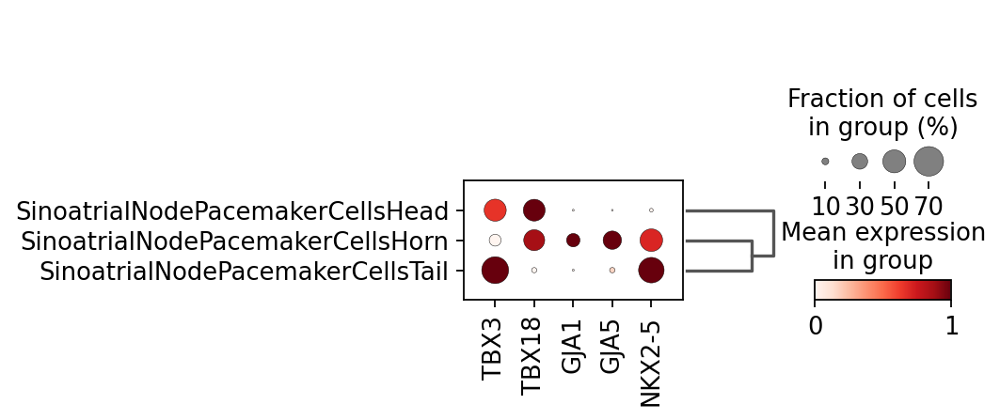

In [20]:
genes = ['TBX3','TBX18',
         'GJA1', # CX43
         'GJA5', # CX40
         'NKX2-5']
genes = [x for x in genes if x in san.var_names]
sc.tl.dendrogram(san,groupby='fine_grain_manual')
sc.pl.dotplot(san,
              var_names=genes,
              groupby='fine_grain_manual',
              standard_scale='var',
              dendrogram=True,show=False
             )
plt.savefig(f'{figdir}/VisiumHD_euploid_SANPC_dotplot-markers.pdf', bbox_inches="tight",dpi=300)